# YOLO models from ultralytics

This notebook allows you to train and test YOLO models from ultralytics.

Here is a list of available models : https://hub.ultralytics.com/models


In [1]:
import supervision as sv
from roboflow import Roboflow

In [ ]:
import supervision as sv
from roboflow import Roboflow
rf = Roboflow(api_key="Z4mFtu232oWID8Vtcntw")
project = rf.workspace("testsew").project("only-axis-camera-images")
version = project.version(3)
#dataset = version.download("yolov8")




: 

In [2]:
import os
path = os.path.join(os.getcwd(), "..","data", "V2")
print(path)

c:\Users\Dorian\Desktop\sew\YOLO\..\data\V2


Choose what version of yolo you want.
| Model | size<br><sup>(pixels) | mAP<sup>val<br>50-95 | Speed<br><sup>CPU ONNX<br>(ms) | Speed<br><sup>A100 TensorRT<br>(ms) | params<br><sup>(M) | FLOPs<br><sup>(B) |
| ----------------------------------------------------------------------------------------- | --------------------- | -------------------- | ------------------------------ | ----------------------------------- | ------------------ | ----------------- |
| [YOLOv8n](https://github.com/ultralytics/assets/releases/download/v8.1.0/yolov8n-oiv7.pt) | 640 | 18.4 | 142.4 | 1.21 | 3.5 | 10.5 |
| [YOLOv8s](https://github.com/ultralytics/assets/releases/download/v8.1.0/yolov8s-oiv7.pt) | 640 | 27.7 | 183.1 | 1.40 | 11.4 | 29.7 |
| [YOLOv8m](https://github.com/ultralytics/assets/releases/download/v8.1.0/yolov8m-oiv7.pt) | 640 | 33.6 | 408.5 | 2.26 | 26.2 | 80.6 |
| [YOLOv8l](https://github.com/ultralytics/assets/releases/download/v8.1.0/yolov8l-oiv7.pt) | 640 | 34.9 | 596.9 | 2.43 | 44.1 | 167.4 |
| [YOLOv8x](https://github.com/ultralytics/assets/releases/download/v8.1.0/yolov8x-oiv7.pt) | 640 | 36.3 | 860.6 | 3.56 | 68.7 | 260.6 |


In [ ]:
!yolo mode=train model=yolov9e.pt data={path}/data.yaml epochs=150 imgsz=640 batch=16

In [11]:
## Used to push the model to roboflow and use it for annotation helping for example.
#version.deploy("yolov8", "runs/detect/train16")

Dependency ultralytics==8.0.134 is required but found version=8.2.14, to fix: `pip install ultralytics==8.0.134`
An error occured when getting the model upload URL: This version already has a trained model. Please generate and train a new version in order to upload model to Roboflow.


In [5]:
from ultralytics import YOLO

model = YOLO("../models/v2_yolov8s.pt")

In [3]:
from typing import Optional, Union

import cv2
import numpy as np

from supervision.annotators.base import BaseAnnotator, ImageType
from supervision.annotators.utils import ColorLookup, resolve_color
from supervision.detection.core import Detections
from supervision.draw.color import Color, ColorPalette
from supervision.utils.conversion import convert_for_annotation_method
import cv2


class MyAnnotator(BaseAnnotator):
    """
    A class for drawing bounding boxes on an image using provided detections.
    """

    def __init__(
        self,
        color: Union["Color", "ColorPalette"] = ColorPalette.DEFAULT,
        thickness: int = 2,
        color_lookup: ColorLookup = ColorLookup.CLASS,
    ):
        self.color: Union[Color, ColorPalette] = color
        self.thickness: int = thickness
        self.color_lookup: ColorLookup = color_lookup

    @convert_for_annotation_method
    def annotate(
        self,
        scene: ImageType,
        detections: Detections,
        custom_color_lookup: Optional[np.ndarray] = None,
    ) -> ImageType:
        mydict = {}
        color_dict = {}

        for detection_idx in range(len(detections)):
            x1, y1, x2, y2 = detections.xyxy[detection_idx].astype(int)
            color = resolve_color(
                color=self.color,
                detections=detections,
                detection_idx=detection_idx,
                color_lookup=self.color_lookup if custom_color_lookup is None else custom_color_lookup,
            )
            cv2.rectangle(
                img=scene,
                pt1=(x1, y1),
                pt2=(x2, y2),
                color=color.as_bgr(),
                thickness=self.thickness,
            )

            class_guessed = detections.class_id[detection_idx]
            if class_guessed not in mydict:
                mydict[class_guessed] = 0
            mydict[class_guessed] += 1
            color_dict[class_guessed] = color

        keys = list(mydict.keys())

        for i in range(len(mydict)):
            key = keys[i]
            classname = model.model.names[key]
            # draw first time in black
            cv2.putText(
                scene,
                f"{classname}: {mydict[key]}",
                (10, 60 + i * 60),
                cv2.FONT_HERSHEY_SIMPLEX,
                2,
                (0, 0, 0),
                4,
                cv2.LINE_AA,
            )
            cv2.putText(
                scene,
                f"{classname}: {mydict[key]}",
                (10, 60 + i * 60),
                cv2.FONT_HERSHEY_SIMPLEX,
                2,
                color_dict[key].as_bgr(),
                4,
                cv2.LINE_AA,
            )

        return scene


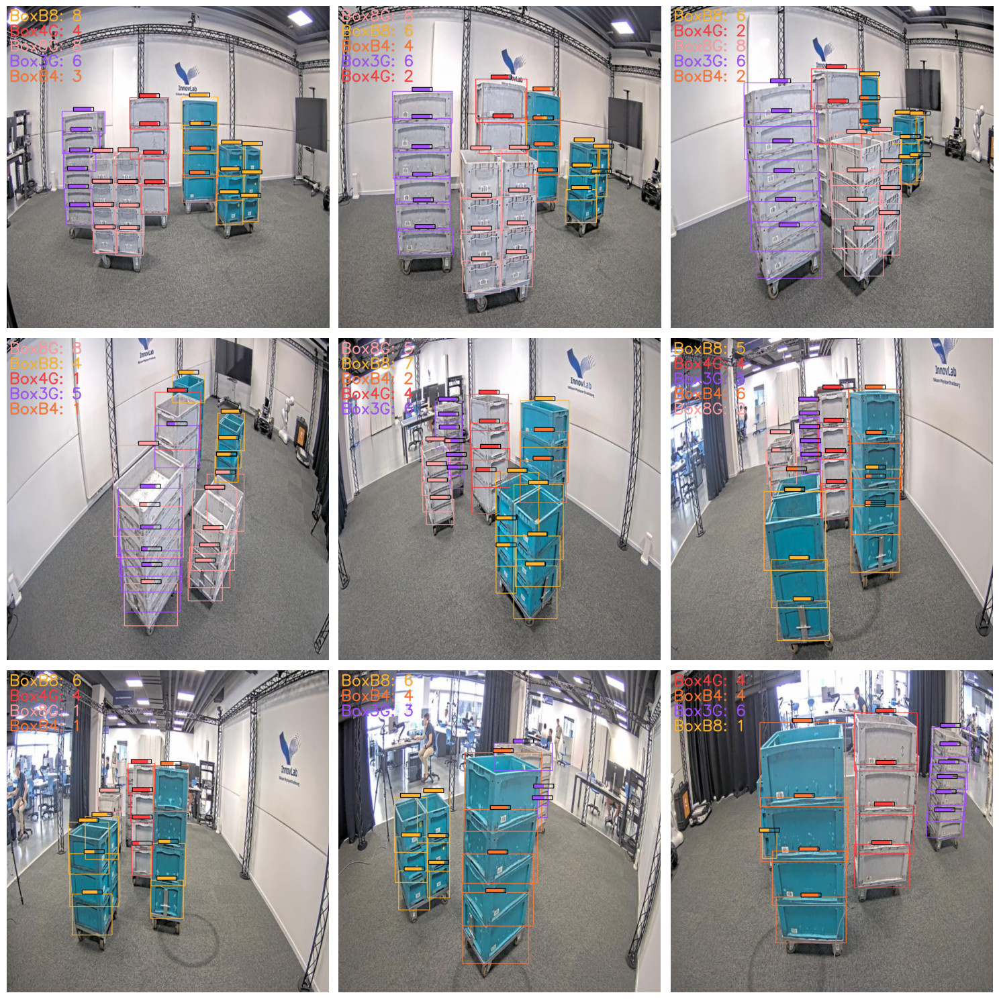

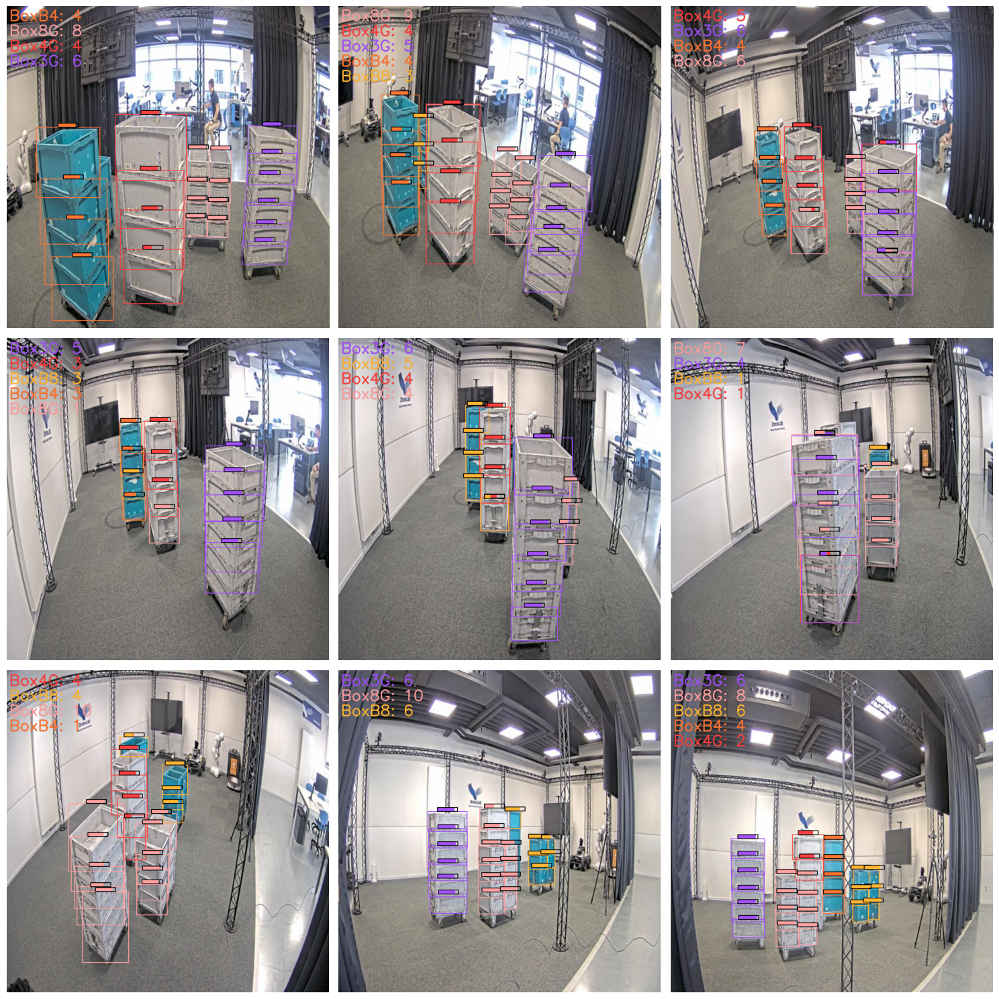

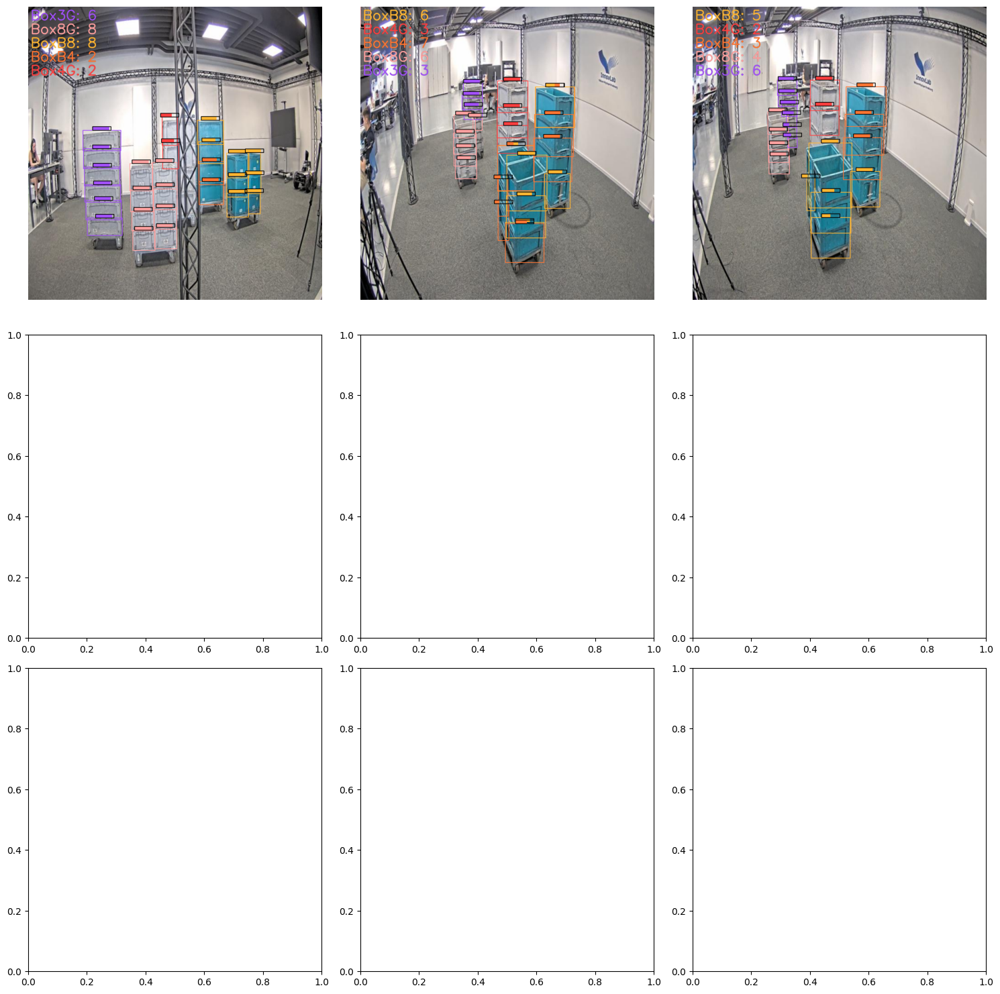

In [23]:
import glob
import cv2
import matplotlib.pyplot as plt
import math

# do not tqdm 

bounding_box_annotator = MyAnnotator()
label_annotator = sv.PercentageBarAnnotator()

image_paths = glob.glob(f"{path}/test/images/*.jpg")
num_images = len(image_paths)

num_grids = math.ceil(num_images / 9)
for grid in range(num_grids):
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # Create a 3x3 grid of subplots
    grid_image_paths = image_paths[grid * 9 : (grid + 1) * 9]

    for ax, image_path in zip(axs.flatten(), grid_image_paths):
        image = cv2.imread(image_path)
        results = model.predict(image, verbose=False)[0]
        detections = sv.Detections.from_ultralytics(results)
        labels = [model.model.names[class_id] for class_id in detections.class_id]
        annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)
        annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)
        ax.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        ax.axis("off")

    plt.tight_layout()
    plt.show()

# Test

In [ ]:
model.val()

# Inference Slicer
https://supervision.roboflow.com/develop/how_to/detect_small_objects/#input-resolution

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import supervision as sv
from ultralytics import YOLO

model = YOLO("../models/v2_yolov8s.pt")

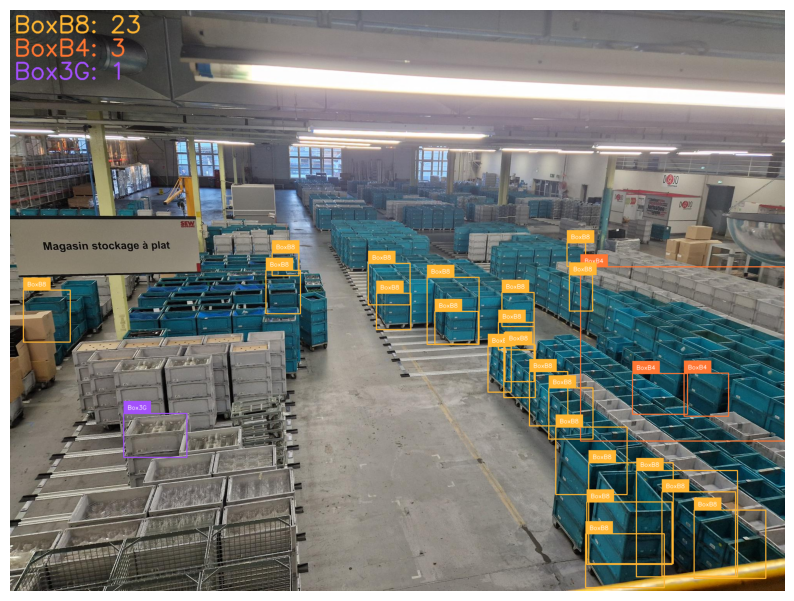

In [12]:
# no slicer
image = cv2.imread("../data/good_highground_images/1000017733.jpg")
bounding_box_annotator = MyAnnotator()
label_annotator = sv.LabelAnnotator()
results = model.predict(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results)
labels = [model.model.names[class_id] for class_id in detections.class_id]
annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

# plot
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()



(-0.5, 1999.5, 1499.5, -0.5)

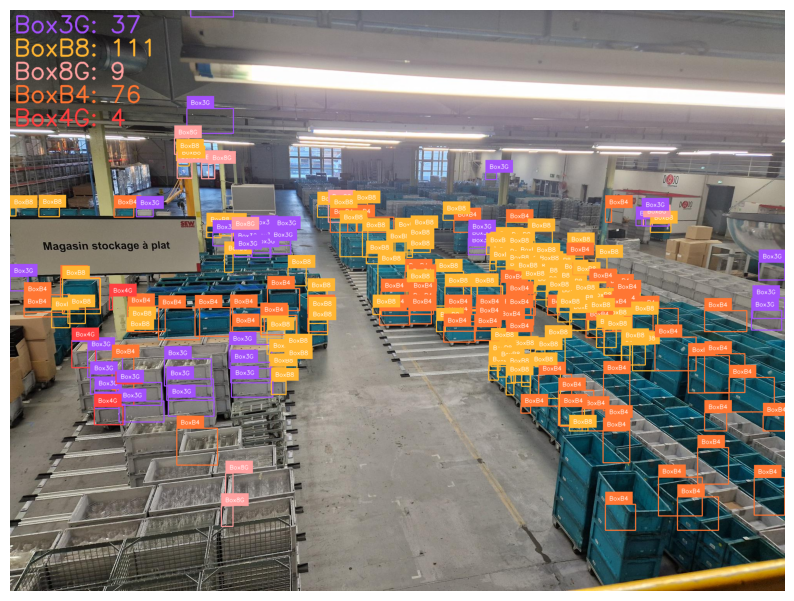

In [10]:
# with slicer
def callback(image_slice: np.ndarray) -> sv.Detections:
    result = model.predict(image_slice, verbose=False)[0]
    return sv.Detections.from_ultralytics(result)


image = cv2.imread("../data/good_highground_images/1000017733.jpg")

bounding_box_annotator = MyAnnotator()
label_annotator = sv.LabelAnnotator()
slicer = sv.InferenceSlicer(callback=callback)
detections = slicer(image)

annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

# Display the annotated image
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
plt.axis("off")


# Average couting errors %

In [18]:
# truth and pred are dictionaries with the format {label: value}

def average_counting_error_percentage(truth: dict, pred: dict):
    nb_errors = 0
    for key in truth.keys():
        if key not in pred:
            nb_errors += truth[key]
        else:
            nb_errors += abs(truth[key] - pred[key])

    for key in pred.keys():
        if key not in truth:
            nb_errors += pred[key]

    return nb_errors / sum(truth.values())

In [20]:
import glob

path = "../data/HardTestImages/"
models = glob.glob("../models/*.pt")
labels_files = sorted(glob.glob(f"{path}/test/labels/*.txt") + glob.glob(f"{path}/valid/labels/*.txt"))
images_files = [labels_file.replace("labels", "images").replace("txt", "jpg") for labels_file in labels_files]


def evaluate_model(model_path: str, images: list, labels_files: list):
    model = YOLO(model_path)
    basename = os.path.basename(model_path)
    nb_errors = 0

    n = len(images)
    for i in range(n):
        # Get the ground truth
        truth = {}
        with open(labels_files[i], "r") as file:
            lines = file.readlines()
        for line in lines:
            class_id, _, _, _, _ = map(float, line.split(" "))
            class_name = model.model.names[int(class_id)]
            truth[class_name] = truth.get(class_name, 0) + 1

        # Get the model predictions
        image = cv2.imread(images[i])
        results = model.predict(image, verbose=False, conf=0.5)[0]
        detections = sv.Detections.from_ultralytics(results)
        labels = [model.model.names[class_id] for class_id in detections.class_id]
        predictions = {}
        for label in labels:
            predictions[label] = predictions.get(label, 0) + 1
        nb_errors += average_counting_error_percentage(truth, predictions)

    print(f"{basename} : {nb_errors / n * 100:.2f}%")


print(f"Starting evaluation of mean counting error percentage on {len(images_files)} images")
for model_path in models:
    evaluate_model(model_path, images_files, labels_files)


Starting evaluation of mean counting error percentage on 21 images
v2_yolov8l.pt : 21.47%
v2_yolov8m.pt : 21.86%
v2_yolov8s.pt : 27.65%
v2_yolov8x.pt : 20.19%
yolov9c.pt : 101.08%
yolov9e.pt : 111.27%


# Video rendering

## Used to generate annotated video from model and video.

When the model is not fast enough to run in real-time, it can be useful to generate a video with the model's predictions.
Showing its strength and weaknesses in a more visual way.


In [13]:
import supervision as sv
import cv2
import os
from tqdm import tqdm


def read_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(frame)
    cap.release()
    return frames


def save_video(output_video_frames, output_video_path):
    fourcc = cv2.VideoWriter_fourcc(*"MJPG")
    out = cv2.VideoWriter(output_video_path, fourcc, 24, (output_video_frames[0].shape[1], output_video_frames[0].shape[0]))
    for frame in output_video_frames:
        out.write(frame)
    out.release()


bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()


def render_video(video_path, output_video_path):
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"File {video_path} does not exist")
    frames = read_video(video_path)
    output_video_frames = []
    for frame in tqdm(frames, desc="Processing frames"):
        frame = cv2.resize(frame, (1280, 1280))
        results = model(frame, iou=0.4, conf=0.3)[0]
        detections = sv.Detections.from_ultralytics(results)
        labels = [model.model.names[class_id] for class_id in detections.class_id]
        annotated_frame = bounding_box_annotator.annotate(scene=frame, detections=detections)
        annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections, labels=labels)
        output_video_frames.append(annotated_frame)
    save_video(output_video_frames, output_video_path)


In [16]:
video_path = "../data/videos/VID20240408175741.mp4"
output_video_path = "output.mp4"
render_video(video_path, output_video_path)

Processing frames: 100%|██████████| 980/980 [00:20<00:00, 48.94it/s]
OpenCV: FFMPEG: tag 0x47504a4d/'MJPG' is not supported with codec id 7 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
